In [1]:
# necessary packages #

using Distributions
using Random
using Distances
using LinearAlgebra
using SparseArrays
using IterativeSolvers
using ProgressMeter
using JLD2
using DataFrames
using MCMCDiagnostics

In [2]:
include("../../../util2.j")

colnorm (generic function with 1 method)

In [3]:
using StatsPlots
using MCMCChains
using PrettyTables

In [4]:
Sys.free_memory()/(2^20*1024)

21.523681640625

In [5]:
@load "../../results/BSLMC_Factor/BSLMC_Factor_sum_data.jld"

11-element Array{Symbol,1}:
 :Y_ord     
 :S_indx    
 :U_indx    
 :M_Sind    
 :U_ind     
 :K         
 :p         
 :q         
 :N_sam     
 :N_pre_burn
 :NM        

In [6]:
@load "../../results/BSLMC_Factor/BSLMC_Factor_mean_var.jld"

8-element Array{Symbol,1}:
 :ω_incp_sam_mean  
 :ω_incp_sam_var   
 :Y_m_sam_mean     
 :Y_m_sam_var      
 :ω_incp_M_sam_mean
 :ω_incp_M_sam_var 
 :Y_M_sam_mean     
 :Y_M_sam_var      

In [7]:
p = 2; K = 2; q = 10;

In [8]:
#load data
using CSV
ϕ_sam = convert(Matrix{Float64}, CSV.read("../../results/BSLMC_Factor/ϕ_sam_nopredC.csv"));
N_sam = Integer(length(ϕ_sam) / K - 1);
ind_ϕ_sam = 1: K :(K * N_sam + 1);
A_sam = convert(Matrix{Float64}, CSV.read("../../results/BSLMC_Factor/A_sam_nopredC.csv"));
ind_A_sam = 1: K :(K * (N_sam - 1) + 1);
γ_sam = convert(Matrix{Float64}, CSV.read("../../results/BSLMC_Factor/γ_sam_nopredC.csv"));
ind_γ_sam = (1: (p + K) :((p + K) * N_sam + 1));
Σ_sam = convert(Matrix{Float64}, CSV.read("../../results/BSLMC_Factor/Σ_sam_nopredC.csv"));
ind_Σ_sam = 1: q :(q * N_sam + 1);
ω_cov_sam = convert(Matrix{Float64}, CSV.read("../../results/BSLMC_Factor/ω_cov_sam_nopredC.csv"));
ind_ω_cov_sam = 1: q :(q * (N_sam - 1) + 1);

In [9]:
N_sam

10000

In [10]:
mean(A_sam[ind_A_sam])

0.26616966169090733

In [11]:
mean(A_sam[ind_A_sam .+ 1])

0.29860948739077287

In [12]:
size(Y_ord)

(1020000, 10)

In [13]:
NM

12057

In [14]:
[length(M_Sind[i]) for i in 1:10]

10-element Array{Int64,1}:
 100799
 100768
 100787
 100767
 100812
 100814
 100770
 100792
 100805
 100794

In [15]:
tt = union(union(union(union(union(union(union(union(union(M_Sind[1], M_Sind[2]), M_Sind[3]),
                            M_Sind[4]), M_Sind[5]), M_Sind[6]), M_Sind[7]), M_Sind[8]), 
        M_Sind[9]), M_Sind[10]);
length(tt)

656366

Posterior prediction

# MCMC Chain check

In [16]:
β_pos_sam = Array{Float64, 3}(undef, N_sam + 1, (p - 0) * q, 1);
β_pos_sam[:, :, 1] = hcat([γ_sam[ind_γ_sam .+ (i - 1) , j][1:(N_sam + 1)] 
        for j in 1:q, i in 1:2]...);
β_chain = Chains(β_pos_sam);
pβ = plot(β_chain)

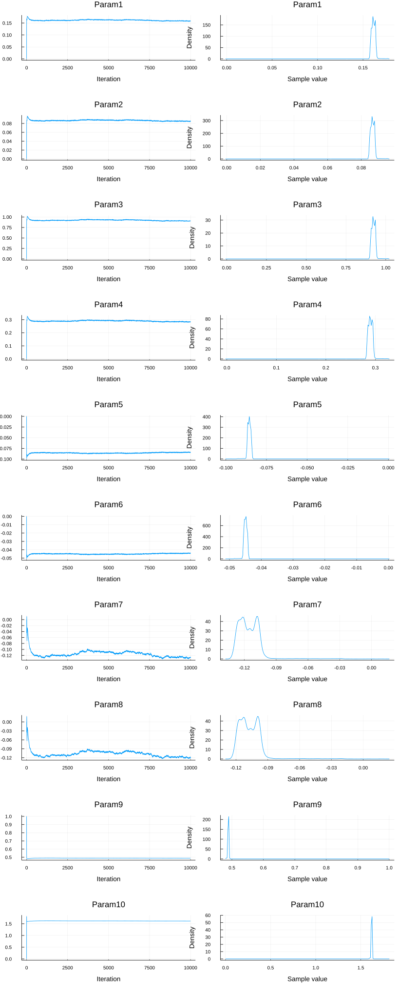

In [17]:
Λ_pos_sam = Array{Float64, 3}(undef, N_sam + 1 , (K -1) * q, 1);
Λ_pos_sam[:, :, 1] = hcat([γ_sam[ind_γ_sam .+ (i - 1), j][1:(N_sam + 1)] 
        for i in (p + 2):(p + 2), j in 1:q]...);
Λ_chain = Chains(Λ_pos_sam);
pΛ = plot(Λ_chain)

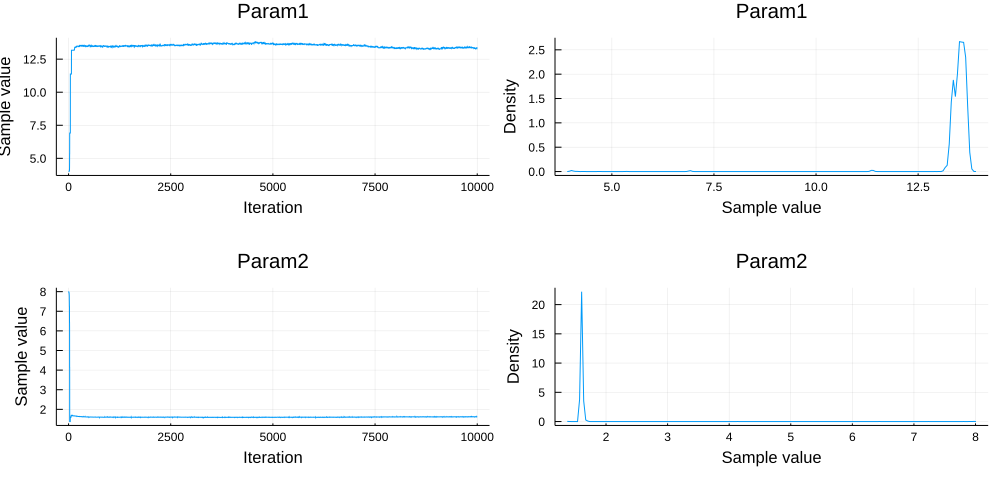

In [18]:
ϕ_pos_sam = Array{Float64, 3}(undef, N_sam + 1, K, 1);
ϕ_pos_sam[:, :, 1] = hcat([(ϕ_sam[ind_ϕ_sam .+ (i - 1)][1:(N_sam + 1)]) for i in 1:K]...);
ϕ_chain = Chains(ϕ_pos_sam);
pϕ = plot(ϕ_chain)

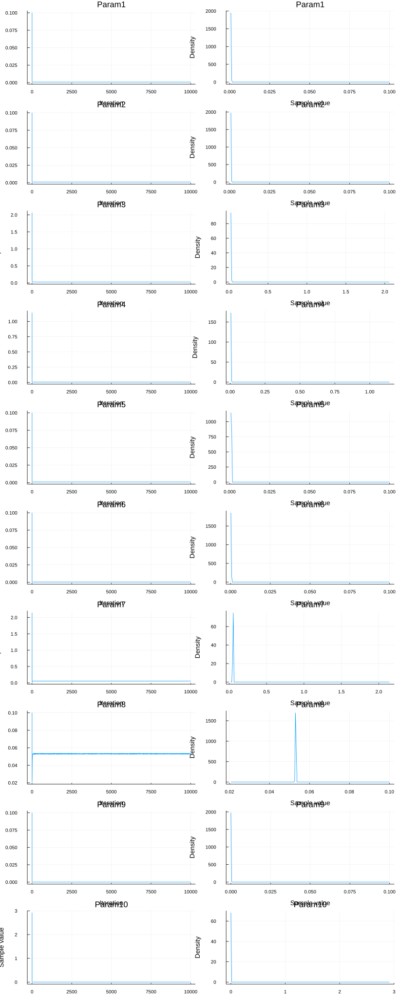

In [19]:
Σ_pos_sam = Array{Float64, 3}(undef, N_sam + 1 , q, 1);
Σ_pos_sam[:, :, 1] =  hcat([Σ_sam[ind_Σ_sam .+ (i - 1)][1:(N_sam + 1)] for i in 1:q]...);
Σ_chain = Chains(Σ_pos_sam);
pΣ = plot(Σ_chain)

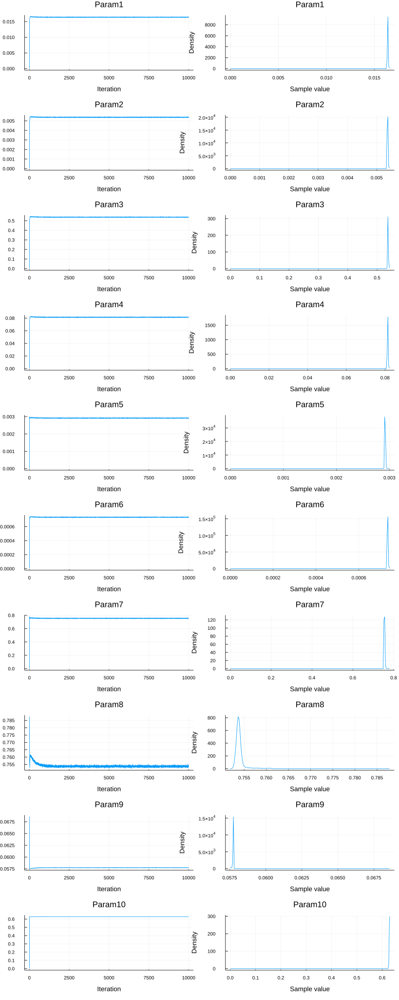

In [20]:
ω_cov_pos_sam = Array{Float64, 3}(undef, N_sam , q, 1);
ω_cov_pos_sam[:, :, 1] = hcat([ω_cov_sam[ind_ω_cov_sam .+ (i - 1), i][1:N_sam] 
        for i in 1:q]...);
ω_cov_chain = Chains(ω_cov_pos_sam);
pωcov = plot(ω_cov_chain)

In [21]:
ω_corr_sam = [(Diagonal([1 / sqrt(ω_cov_sam[ind_ω_cov_sam[l] .+ (i - 1), i]) 
                for i in 1:q]) * ω_cov_sam[ind_ω_cov_sam[l] .+ (1:q) .- 1, 1:q] * 
        Diagonal([1 / sqrt(ω_cov_sam[ind_ω_cov_sam[l] .+ (i - 1), i]) for i in 1:q])) 
    for l in 1:N_sam];

In [22]:
[ω_corr_sam[i][1, 1] for i in 1:10]

10-element Array{Float64,1}:
 0.9999999999999998
 1.0000000000000002
 1.0000000000000004
 1.0               
 1.0               
 1.0               
 1.0               
 1.0000000000000002
 0.9999999999999998
 1.0000000000000002

In [23]:
ω_corr_sam_mean = [mean([ω_corr_sam[i][j , k] for i in (N_pre_burn + 1):N_sam]) 
    for j in 1:q, k in 1:q] 

10×10 Array{Float64,2}:
  1.0        0.999702   1.0       …   0.915473  -0.527544  -0.524519
  0.999702   1.0        0.999716      0.925024  -0.548127  -0.545148
  1.0        0.999716   1.0           0.915716  -0.528057  -0.525033
  0.997117   0.998672   0.997163      0.943365  -0.590482  -0.587607
 -0.994579  -0.991743  -0.994516     -0.868669   0.436347   0.433143
 -0.991718  -0.988287  -0.99164   …  -0.856213   0.414068   0.410827
  0.914326   0.923941   0.914571      0.999996  -0.826388  -0.824379
  0.915473   0.925024   0.915716      1.0       -0.824784  -0.822767
 -0.527544  -0.548127  -0.528057     -0.824784   1.0        0.999994
 -0.524519  -0.545148  -0.525033     -0.822767   0.999994   1.0     

In [24]:
ω_corr_sam_var = [var([ω_corr_sam[i][j , k] for i in (N_pre_burn + 1):N_sam]) 
    for j in 1:q, k in 1:q]

10×10 Array{Float64,2}:
 2.48541e-32  1.54937e-10  4.65497e-14  …  4.87591e-8   4.89701e-8 
 1.54937e-10  2.39712e-32  1.50317e-10     1.52784e-7   1.53746e-7 
 4.65497e-14  1.50317e-10  2.20575e-32     4.57313e-8   4.58793e-8 
 7.63267e-10  7.67583e-10  7.54602e-10     6.06773e-8   6.09764e-8 
 4.95455e-9   1.01685e-8   5.04255e-9      3.391e-7     3.40355e-7 
 7.98471e-9   1.48963e-8   7.89021e-9   …  3.60526e-7   3.60951e-7 
 2.53548e-8   4.38248e-8   2.46219e-8      3.11782e-8   3.14555e-8 
 2.23519e-8   4.49082e-8   2.34927e-8      2.9761e-8    3.00012e-8 
 4.87591e-8   1.52784e-7   4.57313e-8      2.42475e-32  8.58423e-15
 4.89701e-8   1.53746e-7   4.58793e-8      8.58423e-15  2.2018e-32 

In [25]:
ω_cov_pos_sam_mean = [mean(ω_cov_sam[ind_ω_cov_sam .+ (i - 1), j][(N_pre_burn + 1):N_sam]) 
    for i in 1:q, j in 1:q] 

10×10 Array{Float64,2}:
  0.0163888    0.00937923   0.0938115  …  -0.0162303   -0.0532496 
  0.00937923   0.0053709    0.0536887     -0.00965381  -0.0316826 
  0.0938115    0.0536887    0.536989      -0.0929945   -0.305106  
  0.0364234    0.0208837    0.208502      -0.0404913   -0.132963  
 -0.0068764   -0.00392529  -0.0393589      0.00566336   0.0185508 
 -0.0034396   -0.00196224  -0.0196872  …   0.00269595   0.00882648
  0.101647     0.0588015    0.581997      -0.172464    -0.567714  
  0.101743     0.0588522    0.582545      -0.172076    -0.566428  
 -0.0162303   -0.00965381  -0.0929945      0.0577547    0.190578  
 -0.0532496   -0.0316826   -0.305106       0.190578     0.628875  

In [26]:
# check the plot of the data 
using RCall
@rput ω_corr_sam_mean
R"""
library(corrplot)
library(corrgram)

colnames(ω_corr_sam_mean) <- c("NDVI", "EVI","GPP", "PsnNet", 
                         "red refl", "blue refl", 
                         "LE", "ET", "PLE", "PET")
rownames(ω_corr_sam_mean) <- c("NDVI", "EVI","GPP", "PsnNet", 
                         "red reflectance", "blue reflectance", 
                         "LE", "ET", "PLE", "PET")

width <- 720
height <- 720
pointsize <- 16


png(paste("../../pics/BSLMC_factor_corr_plot.png", sep = ""), 
    width = width, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
#corrplot(ω_corr_sam_mean, method="number", type = "upper", diag = FALSE, 
#         addshade = "negative", number.digits = 2, tl.pos = "td")

corrgram(ω_corr_sam_mean, order=FALSE, lower.panel=panel.shade, gap = 0.2,
         upper.panel=panel.pie, text.panel=panel.txt, main=" ",
         col.regions = colorRampPalette(c( "darkseagreen3",
                                           "white", "cadetblue3")))
dev.off()
"""

┌ Warning: RCall.jl: corrplot 0.84 loaded
└ @ RCall /home/lu/.julia/packages/RCall/g7dhB/src/io.jl:113
┌ Warning: RCall.jl: Registered S3 method overwritten by 'seriation':
│   method         from 
│   reorder.hclust gclus
└ @ RCall /home/lu/.julia/packages/RCall/g7dhB/src/io.jl:113


RObject{IntSxp}
null device 
          1 


# Posterior Inference 

In [27]:
N_pre_burn = Integer(0.5 * N_sam);
half_sample = Integer((N_sam - N_pre_burn)/2)

2500

In [28]:
# ESS-slope #
ESS_slope = fill(0.0, p, q)
MCSE_slope = fill(0.0, p, q)
Rhat_slope = fill(0.0, p, q)
for i in 1:p
    for j in 1:q
        ESS_slope[i, j] = 
            effective_sample_size(γ_sam[ind_γ_sam .+ (i - 1), j][(N_pre_burn + 1):(N_sam + 1)]);
        MCSE_slope[i, j] = std(γ_sam[ind_γ_sam .+ (i - 1), j][(N_pre_burn + 1):(N_sam + 1)]) / 
            sqrt(ESS_slope[i, j]);
        Rhat_slope[i, j] = potential_scale_reduction(
            γ_sam[ind_γ_sam .+ (i - 1), j][(N_pre_burn + 1):(N_pre_burn + half_sample)], 
            γ_sam[ind_γ_sam .+ (i - 1), j][(N_pre_burn + half_sample + 1):N_sam])
    end
end   
round.(ESS_slope; digits = 1)

2×10 Array{Float64,2}:
   2.7    2.8    2.7    2.8    2.8    2.8   3.3   3.3  2.1  2.1
 217.7  506.9  195.5  198.5  816.0  744.6  85.1  72.0  7.0  6.9

In [29]:
[maximum(MCSE_slope), maximum(Rhat_slope)]

2-element Array{Float64,1}:
 0.008133218244348268
 2.360172596832263   

In [30]:
# ESS-cov #
ESS_ω_cov = fill(0.0, q, q)
MCSE_ω_cov = fill(0.0, q, q)
Rhat_ω_cov = fill(0.0, q, q)
for j in 1:q
    for i in 1:q
        ESS_ω_cov[i, j] = 
            effective_sample_size(ω_cov_sam[ind_ω_cov_sam .+ (i - 1), j][(N_pre_burn + 1):N_sam]);
        MCSE_ω_cov[i, j] = std(ω_cov_sam[ind_ω_cov_sam .+ (i - 1), j][(N_pre_burn + 1):N_sam]) / 
            sqrt(ESS_ω_cov[i, j]);
        Rhat_ω_cov[i, j] = potential_scale_reduction(
            ω_cov_sam[ind_ω_cov_sam .+ (i - 1), j][(N_pre_burn + 1):(N_pre_burn + half_sample)], 
            ω_cov_sam[ind_ω_cov_sam .+ (i - 1), j][(N_pre_burn + half_sample + 1):N_sam]);
    end
end
[minimum(ESS_ω_cov), maximum(MCSE_ω_cov), maximum(Rhat_ω_cov)]

3-element Array{Float64,1}:
 22.948099430394166   
  9.082459393022032e-6
  1.0160473179268499  

In [31]:
# ESS-corr #
ESS_ω_corr = fill(0.0, q, q)
MCSE_ω_corr = fill(0.0, q, q)
Rhat_ω_corr = fill(0.0, q, q)
for j in 1:q
    for i in 1:q
        ESS_ω_corr[i, j] = 
            effective_sample_size([ω_corr_sam[k][i, j] for k in (N_pre_burn + 1):N_sam]);
        MCSE_ω_corr[i, j] = std([ω_corr_sam[k][i, j] for k in (N_pre_burn + 1):N_sam]) / 
            sqrt(ESS_ω_corr[i, j]);
        Rhat_ω_corr[i, j] = potential_scale_reduction(
            [ω_corr_sam[k][i, j] for k in (N_pre_burn + 1):(N_pre_burn + half_sample)], 
            [ω_corr_sam[k][i, j] for k in (N_pre_burn + half_sample + 1):N_sam]);
    end
end
[minimum(ESS_ω_corr), maximum(MCSE_ω_corr), maximum(Rhat_ω_corr)]

3-element Array{Float64,1}:
 330.2742018639377      
   1.1993301651050686e-5
   1.0026260315164346   

In [32]:
# ESS-ϕ #
ESS_ϕ = fill(0.0, K)
MCSE_ϕ = fill(0.0, K)
Rhat_ϕ = fill(0.0, K)
for i in 1:K
    ESS_ϕ[i] = 
        effective_sample_size(ϕ_pos_sam[(N_pre_burn + 1):N_sam, i, 1]);
    MCSE_ϕ[i] = std(ϕ_pos_sam[(N_pre_burn + 1):N_sam, i, 1]) / sqrt(ESS_ϕ[i]);
    Rhat_ϕ[i] = potential_scale_reduction(
            ϕ_pos_sam[(N_pre_burn + 1):(N_pre_burn + half_sample), i, 1], 
            ϕ_pos_sam[(N_pre_burn + half_sample + 1):N_sam, i, 1]);
end
[ESS_ϕ, MCSE_ϕ, Rhat_ϕ]

3-element Array{Array{Float64,1},1}:
 [2.260423569065709, 2.269599972181192]     
 [0.08644329246687547, 0.006032842227042683]
 [3.145416516902865, 2.9650619190993943]    

In [33]:
#using RCall
## ESS-ϕ #
#ESS_ϕ = fill(0.0, K)
#MCSE_ϕ = fill(0.0, K)
#Rhat_ϕ = fill(0.0, K)
#for i in 1:K
#    tt = ϕ_pos_sam[(N_pre_burn + 1):N_sam, i, 1]
#    @rput tt
#    R"""
#    library(mcmcse)
#    ess = ess(tt)
#    se = mcse(tt)$se
#    """
#    @rget ess
#    @rget se
#    ESS_ϕ[i] = ess;
#    MCSE_ϕ[i] = se;
#    Rhat_ϕ[i] = potential_scale_reduction(
#            ϕ_pos_sam[(N_pre_burn + 1):(N_pre_burn + half_sample), i, 1], 
#            ϕ_pos_sam[(N_pre_burn + half_sample + 1):N_sam, i, 1]);
#end
#[ESS_ϕ, MCSE_ϕ, Rhat_ϕ]

In [34]:
# ESS-Σ #
ESS_Σ = fill(0.0, q)
MCSE_Σ = fill(0.0, q)
Rhat_Σ = fill(0.0, q)
for i in 1:q
    ESS_Σ[i] = 
        effective_sample_size(Σ_sam[ind_Σ_sam .+ (i - 1)][(N_pre_burn + 1):N_sam]);
    MCSE_Σ[i] = std(Σ_sam[ind_Σ_sam .+ (i - 1)][(N_pre_burn + 1):N_sam]) / sqrt(ESS_Σ[i]);
    Rhat_Σ[i] = potential_scale_reduction(
            Σ_sam[ind_Σ_sam .+ (i - 1)][(N_pre_burn + 1):(N_pre_burn + half_sample)], 
            Σ_sam[ind_Σ_sam .+ (i - 1)][(N_pre_burn + half_sample + 1):N_sam]);
end
[minimum(ESS_Σ), maximum(MCSE_Σ), maximum(Rhat_Σ)]

3-element Array{Float64,1}:
 217.60355252229652    
   2.365262245697304e-6
   1.007072582025916   

In [59]:
summary_table = Array{Float64, 2}(undef, 32, 8);
summary_table[1, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 1, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 1, 1], [0.5, 0.025, 0.975]), 
    ESS_slope[1, 1], MCSE_slope[1, 1], Rhat_slope[1, 1]);
summary_table[2, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 2, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 2, 1], [0.5, 0.025, 0.975]),
    ESS_slope[1, 2], MCSE_slope[1, 2], Rhat_slope[1, 2]);
summary_table[3, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 3, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 3, 1], [0.5, 0.025, 0.975]),
    ESS_slope[1, 3], MCSE_slope[1, 3], Rhat_slope[1, 3]);
summary_table[4, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 4, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 4, 1], [0.5, 0.025, 0.975]),
    ESS_slope[1, 4], MCSE_slope[1, 4], Rhat_slope[1, 4]);
summary_table[5, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 5, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 5, 1], [0.5, 0.025, 0.975]),
    ESS_slope[1, 5], MCSE_slope[1, 5], Rhat_slope[1, 5]);
summary_table[6, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 6, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 6, 1], [0.5, 0.025, 0.975]),
    ESS_slope[1, 6], MCSE_slope[1, 6], Rhat_slope[1, 6]);
summary_table[7, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 7, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 7, 1], [0.5, 0.025, 0.975]),
    ESS_slope[1, 7], MCSE_slope[1, 7], Rhat_slope[1, 7]);
summary_table[8, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 8, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 8, 1], [0.5, 0.025, 0.975]),
    ESS_slope[1, 8], MCSE_slope[1, 8], Rhat_slope[1, 8]);
summary_table[9, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 9, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 9, 1], [0.5, 0.025, 0.975]),
    ESS_slope[1, 9], MCSE_slope[1, 9], Rhat_slope[1, 9]);
summary_table[10, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 10, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 10, 1], [0.5, 0.025, 0.975]),
    ESS_slope[1, 10], MCSE_slope[1, 10], Rhat_slope[1, 10]);
summary_table[11, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 11, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 11, 1], [0.5, 0.025, 0.975]),
    ESS_slope[2, 1], MCSE_slope[2, 1], Rhat_slope[2, 1]);
summary_table[12, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 12, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 12, 1], [0.5, 0.025, 0.975]),
    ESS_slope[2, 2], MCSE_slope[2, 2], Rhat_slope[2, 2]);
summary_table[13, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 13, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 13, 1], [0.5, 0.025, 0.975]),
    ESS_slope[2, 3], MCSE_slope[2, 3], Rhat_slope[2, 3]);
summary_table[14, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 14, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 14, 1], [0.5, 0.025, 0.975]),
    ESS_slope[2, 4], MCSE_slope[2, 4], Rhat_slope[2, 4]);
summary_table[15, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 15, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 15, 1], [0.5, 0.025, 0.975]),
    ESS_slope[2, 5], MCSE_slope[2, 5], Rhat_slope[2, 5]);
summary_table[16, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 16, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 16, 1], [0.5, 0.025, 0.975]),
    ESS_slope[2, 6], MCSE_slope[2, 6], Rhat_slope[2, 6]);
summary_table[17, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 17, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 17, 1], [0.5, 0.025, 0.975]),
    ESS_slope[2, 7], MCSE_slope[2, 7], Rhat_slope[2, 7]);
summary_table[18, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 18, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 18, 1], [0.5, 0.025, 0.975]),
    ESS_slope[2, 8], MCSE_slope[2, 8], Rhat_slope[2, 8]);
summary_table[19, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 19, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 19, 1], [0.5, 0.025, 0.975]),
    ESS_slope[2, 9], MCSE_slope[2, 9], Rhat_slope[2, 9]);
summary_table[20, :] = vcat(0.0, mean(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 20, 1]),
    quantile(β_pos_sam[(N_pre_burn + 1):(N_sam + 1), 20, 1], [0.5, 0.025, 0.975]),
    ESS_slope[2, 10], MCSE_slope[2, 10], Rhat_slope[2, 10]);
summary_table[21, :] = vcat(0.0, mean(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 1, 1]),
    quantile(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 1, 1], [0.5, 0.025, 0.975]),
    ESS_Σ[1], MCSE_Σ[1], Rhat_Σ[1]);
summary_table[22, :] = vcat(0.0, mean(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 2, 1]),
    quantile(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 2, 1], [0.5, 0.025, 0.975]),
    ESS_Σ[2], MCSE_Σ[2], Rhat_Σ[2]);
summary_table[23, :] = vcat(0.0, mean(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 3, 1]),
    quantile(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 3, 1], [0.5, 0.025, 0.975]),
    ESS_Σ[3], MCSE_Σ[3], Rhat_Σ[3]);
summary_table[24, :] = vcat(0.0, mean(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 4, 1]),
    quantile(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 4, 1], [0.5, 0.025, 0.975]),
    ESS_Σ[4], MCSE_Σ[4], Rhat_Σ[4]);
summary_table[25, :] = vcat(0.0, mean(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 5, 1]),
    quantile(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 5, 1], [0.5, 0.025, 0.975]),
    ESS_Σ[5], MCSE_Σ[5], Rhat_Σ[5]);
summary_table[26, :] = vcat(0.0, mean(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 6, 1]),
    quantile(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 6, 1], [0.5, 0.025, 0.975]),
    ESS_Σ[6], MCSE_Σ[6], Rhat_Σ[6]);
summary_table[27, :] = vcat(0.0, mean(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 7, 1]),
    quantile(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 7, 1], [0.5, 0.025, 0.975]),
    ESS_Σ[7], MCSE_Σ[7], Rhat_Σ[7]);
summary_table[28, :] = vcat(0.0, mean(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 8, 1]),
    quantile(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 8, 1], [0.5, 0.025, 0.975]),
    ESS_Σ[8], MCSE_Σ[8], Rhat_Σ[8]);
summary_table[29, :] = vcat(0.0, mean(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 9, 1]),
    quantile(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 9, 1], [0.5, 0.025, 0.975]),
    ESS_Σ[9], MCSE_Σ[9], Rhat_Σ[9]);
summary_table[30, :] = vcat(0.0, mean(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 10, 1]),
    quantile(Σ_pos_sam[(N_pre_burn + 1):(N_sam + 1), 10, 1], [0.5, 0.025, 0.975]),
    ESS_Σ[10], MCSE_Σ[10], Rhat_Σ[10]);
summary_table[31, :] = vcat(0.0, mean(ϕ_sam[ind_ϕ_sam][(N_pre_burn + 1):N_sam]),
    quantile(ϕ_sam[ind_ϕ_sam][(N_pre_burn + 1):N_sam], [0.5, 0.025, 0.975]), 
    0.0, 0.0, 0.0);
summary_table[32, :] = vcat(0.0, mean(ϕ_sam[ind_ϕ_sam .+ 1][(N_pre_burn + 1):N_sam]),
    quantile(ϕ_sam[ind_ϕ_sam .+ 1][(N_pre_burn + 1):N_sam], [0.5, 0.025, 0.975]),
    0.0, 0.0, 0.0);
summary_table = round.(summary_table; digits = 11);
rnames = ["β[1, 1]","β[1, 2]", "β[1, 3]", "β[1, 4]","β[1, 5]", "β[1, 6]", 
    "β[1, 7]","β[1, 8]", "β[1, 9]", "β[1, 10]", "β[2, 1]","β[2, 2]", "β[2, 3]", "β[2, 4]","β[2, 5]", "β[2, 6]", 
    "β[2, 7]","β[2, 8]", "β[2, 9]", "β[2, 10]", "Σ_1", "Σ_2", "Σ_3", 
    "Σ_4", "Σ_5", "Σ_6", "Σ_7", "Σ_8", "Σ_9", "Σ_10", "ϕ1", "ϕ2"];
summary_table = [rnames summary_table];
pretty_table(summary_table[1:10, :],  ["" "true" "mean" "median" "2.5%" "97.5%" "ESS" "MSCE" "Rhat"], markdown)

|          | true |           mean |         median |           2.5% |         ⋯
|----------|------|----------------|----------------|----------------|-------- ⋯
|  β[1, 1] |  0.0 | -0.27913807026 | -0.27926234204 | -0.28346573695 | -0.2750 ⋯
|  β[1, 2] |  0.0 | -0.13663219065 | -0.13669491465 |    -0.13914382 | -0.1342 ⋯
|  β[1, 3] |  0.0 | -7.53155324792 | -7.53239379887 | -7.55610405539 | -7.5083 ⋯
|  β[1, 4] |  0.0 | -4.53417505535 | -4.53436062789 | -4.54316860652 | -4.5255 ⋯
|  β[1, 5] |  0.0 |  0.39556311314 |  0.39560234158 |  0.39356850961 |  0.3975 ⋯
|  β[1, 6] |  0.0 |  0.20392317001 |  0.20394165823 |  0.20292595225 |  0.2049 ⋯
|  β[1, 7] |  0.0 |  3.59870729114 |  3.59855486435 |  3.58080451389 |  3.6160 ⋯
|  β[1, 8] |  0.0 |  0.15368807115 |  0.15361603383 |   0.1354996029 |  0.1709 ⋯
|  β[1, 9] |  0.0 |  1.02439534125 |  1.02488918638 |  1.02216020396 |  1.0256 ⋯
| β[1, 10] |  0.0 |  3.28299991533 |  3.28460818475 |  3.27553824679 |  3.2873 ⋯


In [60]:
pretty_table(summary_table[11:32, :],  ["" "true" "mean" "median" "2.5%" "97.5%" "ESS" "MCSE" "Rhat"], markdown)

|          | true |           mean |         median |           2.5% |         ⋯
|----------|------|----------------|----------------|----------------|-------- ⋯
|  β[2, 1] |  0.0 | -0.01202586465 | -0.01202977397 | -0.01240453353 | -0.0116 ⋯
|  β[2, 2] |  0.0 | -0.00438002458 | -0.00438024078 | -0.00468049236 | -0.0040 ⋯
|  β[2, 3] |  0.0 | -0.19673512844 | -0.19673527552 | -0.19894126438 | -0.1943 ⋯
|  β[2, 4] |  0.0 | -0.00447705142 | -0.00447587787 | -0.00539086109 | -0.0035 ⋯
|  β[2, 5] |  0.0 |  0.00448500913 |   0.0044886757 |  0.00419908456 |   0.004 ⋯
|  β[2, 6] |  0.0 |    0.012254858 |  0.01225487504 |  0.01211042147 |  0.0124 ⋯
|  β[2, 7] |  0.0 |  0.09075711071 |  0.09072651728 |    0.088388333 |  0.0932 ⋯
|  β[2, 8] |  0.0 |  0.09190369114 |  0.09188455049 |  0.08948055393 |  0.0944 ⋯
|  β[2, 9] |  0.0 | -0.00364002054 | -0.00362487662 | -0.00397959504 | -0.0033 ⋯
| β[2, 10] |  0.0 | -0.00487780113 | -0.00482561946 | -0.00599032284 | -0.0039 ⋯
|      Σ_1 |  0.0 |  0.00074

In [61]:
pretty_table(summary_table[1:10, [1, 3, 7, 9]],  ["" "mean" "ESS" "Rhat"], markdown)

|          |           mean |           ESS |          Rhat |
|----------|----------------|---------------|---------------|
|  β[1, 1] | -0.27913807026 | 2.74114577007 | 2.04756921124 |
|  β[1, 2] | -0.13663219065 | 2.84526153753 | 1.98898110448 |
|  β[1, 3] | -7.53155324792 | 2.70937647464 | 2.07100061317 |
|  β[1, 4] | -4.53417505535 | 2.79273267333 |  2.0266079217 |
|  β[1, 5] |  0.39556311314 | 2.80794955924 | 1.99409525358 |
|  β[1, 6] |  0.20392317001 | 2.79776672236 | 1.99820570522 |
|  β[1, 7] |  3.59870729114 | 3.25877792233 | 1.75259202313 |
|  β[1, 8] |  0.15368807115 | 3.27756859888 | 1.76061548837 |
|  β[1, 9] |  1.02439534125 | 2.12266680361 | 2.33202394044 |
| β[1, 10] |  3.28299991533 |  2.1112669571 | 2.36017259683 |


In [62]:
pretty_table(summary_table[11:32, [1, 3, 5, 6, 8]],  ["" "mean" "2.5%" "97.5%" "MCSE"], markdown)

|          |           mean |           2.5% |          97.5% |          MCSE |
|----------|----------------|----------------|----------------|---------------|
|  β[2, 1] | -0.01202586465 | -0.01240453353 | -0.01162321883 |   1.366204e-5 |
|  β[2, 2] | -0.00438002458 | -0.00468049236 | -0.00407781357 |    6.85559e-6 |
|  β[2, 3] | -0.19673512844 | -0.19894126438 | -0.19438796207 |   8.312083e-5 |
|  β[2, 4] | -0.00447705142 | -0.00539086109 | -0.00350406666 |   3.415665e-5 |
|  β[2, 5] |  0.00448500913 |  0.00419908456 |   0.0047665974 |    5.10711e-6 |
|  β[2, 6] |    0.012254858 |  0.01211042147 |  0.01240196729 |    2.74185e-6 |
|  β[2, 7] |  0.09075711071 |    0.088388333 |  0.09324908848 |  0.0001358317 |
|  β[2, 8] |  0.09190369114 |  0.08948055393 |  0.09442595963 | 0.00014935957 |
|  β[2, 9] | -0.00364002054 | -0.00397959504 | -0.00336207929 |   5.502033e-5 |
| β[2, 10] | -0.00487780113 | -0.00599032284 | -0.00395687293 | 0.00018050789 |
|      Σ_1 |  0.00074552171 |  0.0007424

In [39]:
# MAE #
MAE = (sum(abs.(Y_ord[U_indx, :] - Y_M_sam_mean)) + 
    sum([sum(abs.(Y_m_sam_mean[i] - Y_ord[S_indx[M_Sind[i]], i])) for i in 1:q])) / 
    (sum([length(M_Sind[i]) for i in 1:q]) + q * length(U_indx))
MAE_list = fill(0.0, q);
for i in 1:q
    MAE_list[i] = (sum(abs.(Y_ord[U_indx, i] - Y_M_sam_mean[:, i])) + 
    sum(abs.(Y_m_sam_mean[i] - Y_ord[S_indx[M_Sind[i]], i]))) / 
    (length(M_Sind[i]) + length(U_indx))
end
print(round.(MAE_list, digits = 4))
print(round(MAE, digits = 4))

[0.0252, 0.021, 0.1562, 0.0615, 0.0263, 0.0132, 0.2143, 0.2137, 0.009, 0.0291]0.077

In [40]:
# RMSPE #
MSPE = (sum((Y_ord[U_indx, :] - Y_M_sam_mean).^2) + 
    sum([sum((Y_m_sam_mean[i] - Y_ord[S_indx[M_Sind[i]], i]).^2) for i in 1:q])) / 
    (sum([length(M_Sind[i]) for i in 1:q]) + q * length(U_indx))
RMSPE = sqrt(MSPE); 
print(round.([sqrt((sum((Y_ord[U_indx, i] - Y_M_sam_mean[:, i]).^2) + 
        sum((Y_m_sam_mean[i] - Y_ord[S_indx[M_Sind[i]], i]).^2)) / 
        (length(M_Sind[i]) + length(U_indx))) for i in 1:q], digits = 4));
print(round(RMSPE, digits = 4));

[0.038, 0.0314, 0.2209, 0.0866, 0.0335, 0.017, 0.2785, 0.278, 0.02, 0.066]0.1482

In [41]:
# CRPS #
CRPS_list = [Array{Float64}(undef, length(M_Sind[i])) for i in 1:q];
for i in 1:q
    CRPS_list[i] = (sqrt.(Y_m_sam_var[i]) .* ( 1 /sqrt(π) .- 
        2 * pdf.(Normal(), (Y_ord[S_indx[M_Sind[i]], i] - Y_m_sam_mean[i]) ./ 
                    sqrt.(Y_m_sam_var[i])) .-
        ((Y_ord[S_indx[M_Sind[i]], i] - Y_m_sam_mean[i]) ./ sqrt.(Y_m_sam_var[i])) .* 
        (2 * cdf.(Normal(), (Y_ord[S_indx[M_Sind[i]], i] - Y_m_sam_mean[i]) ./ 
                        sqrt.(Y_m_sam_var[i])) .- 1 )));
end
CRPS_M = [(sqrt(Y_M_sam_var[i, j]) * ( 1 /sqrt(π) - 
        2 * pdf(Normal(), (Y_ord[U_indx[i], j] - Y_M_sam_mean[i, j]) / sqrt(Y_M_sam_var[i, j])) -
        ((Y_ord[U_indx[i], j] - Y_M_sam_mean[i, j]) / sqrt(Y_M_sam_var[i, j])) * 
        (2* cdf(Normal(), (Y_ord[U_indx[i], j] - Y_M_sam_mean[i, j]) / sqrt(Y_M_sam_var[i, j])) - 1)))
        for i in 1:NM, j in 1:q];
print(round.([((sum(CRPS_list[i]) + sum(CRPS_M[:, i])) / 
        (length(M_Sind[i]) + NM)) for i in 1:q], digits = 4))
print(round((sum(sum.(CRPS_list)) + sum(CRPS_M)) / 
    (sum(length.(M_Sind)) + NM * q), digits = 4))

[-0.0187, -0.016, -0.1119, -0.0453, -0.0186, -0.0094, -0.1494, -0.1489, -0.007, -0.0228]-0.0548

In [42]:
# CVG #
N_Inf_burn = 1;
count_Y_M = fill(0.0, q);
for j in 1:q
    for i in 1:NM
        count_Y_M[j] = count_Y_M[j] + 
        (((Y_M_sam_mean[i, j] - 1.96 * sqrt(Y_M_sam_var[i, j])) < Y_ord[U_indx[i], j]) && 
            ((Y_M_sam_mean[i, j] + 1.96 * sqrt(Y_M_sam_var[i, j])) > Y_ord[U_indx[i], j]))
    end
end
for j in 1:q
    for i in 1:length(M_Sind[j])
        count_Y_M[j] = count_Y_M[j] + 
            (((Y_m_sam_mean[j][i] - 1.96 * sqrt(Y_m_sam_var[j][i])) < Y_ord[S_indx[M_Sind[j][i]], j]) && 
             ((Y_m_sam_mean[j][i] + 1.96 * sqrt(Y_m_sam_var[j][i])) > Y_ord[S_indx[M_Sind[j][i]], j]))
    end
end
print(round.([count_Y_M[i] / (length(M_Sind[i]) + length(U_indx)) for i in 1:q], digits = 3))
print(round(sum(count_Y_M) / sum([(length(M_Sind[i]) + length(U_indx)) for i in 1:q]), digits = 3))

[0.948, 0.957, 0.951, 0.963, 0.945, 0.946, 0.953, 0.954, 0.984, 0.984]0.958

In [43]:
# INT #
INT_list = [Array{Float64}(undef, length(M_Sind[i])) for i in 1:q];
for i in 1:q
    INT_list[i] = ((2 * 1.96 * sqrt.(Y_m_sam_var[i])) .+ 
                (2 / 0.05) * (Y_m_sam_mean[i] .- 1.96 * sqrt.(Y_m_sam_var[i]) .- 
            Y_ord[S_indx[M_Sind[i]], i]) .* 
                (Y_ord[S_indx[M_Sind[i]], i] .< (Y_m_sam_mean[i] .- 1.96 * sqrt.(Y_m_sam_var[i]))) + 
                (2 / 0.05) * (Y_ord[S_indx[M_Sind[i]], i] - Y_m_sam_mean[i] .- 
            1.96 * sqrt.(Y_m_sam_var[i])) .* 
                (Y_ord[S_indx[M_Sind[i]], i] .> (Y_m_sam_mean[i] + 1.96 * sqrt.(Y_m_sam_var[i]))));
end
INT_M = [((2 * 1.96 * sqrt(Y_M_sam_var[i, j])) + 
                (2 / 0.05)*(Y_M_sam_mean[i, j] - 1.96 * sqrt(Y_M_sam_var[i]) - Y_ord[U_indx[i], j]) * 
                (Y_ord[U_indx[i], j] < (Y_M_sam_mean[i, j] - 1.96 * sqrt(Y_M_sam_var[i, j]))) + 
                (2 / 0.05)*(Y_ord[U_indx[i], j] - Y_M_sam_mean[i, j] - 1.96 * sqrt(Y_M_sam_var[i, j])) * 
                (Y_ord[U_indx[i], j] > (Y_M_sam_mean[i, j] + 
                1.96 * sqrt(Y_M_sam_var[i, j])))) for i in 1:NM, j in 1:q]
print(round.([((sum(INT_list[i]) + sum(INT_M[:, i])) / 
        (length(M_Sind[i]) + NM)) for i in 1:q], digits = 4))
print(round((sum(sum.(INT_list)) + sum(INT_M)) / 
    (sum(length.(M_Sind)) + NM * q), digits = 4))

[0.2002, 0.1898, 1.0453, 0.4757, 0.1394, 0.0586, 1.222, 1.222, 0.0765, 0.2528]0.4882

In [44]:
[sqrt(var(Y_ord[:, i])) for i in 1:q];

In [45]:
using RData
data_cleaned = load("../../data/rawdata/data_cleaned_small_expanded.RData", convert = true)["data_cleaned_small"];

In [46]:
coords_xy = hcat((round.((data_cleaned.x[S_indx] .- 329) ./ (463 * 8); digits = 0) .*(463 * 8) .+ 329),
    (round.((data_cleaned.y[S_indx] .- 168) ./ (463 * 8); digits = 0) .*(463 * 8) .+ 168));
coords_xy_pred = hcat((round.((data_cleaned.x[U_indx] .- 329) ./ (463 * 8); digits = 0) .*(463 * 8) .+ 329),
    (round.((data_cleaned.y[U_indx] .- 168) ./ (463 * 8); digits = 0) .*(463 * 8) .+ 168));
ω_incp_fit = vcat(ω_incp_sam_mean, ω_incp_M_sam_mean); coords_xy_ω = vcat(coords_xy, coords_xy_pred);
Y_fit_1 = vcat(copy(Y_ord[S_indx, 1]), Y_M_sam_mean[:, 1]); Y_fit_1[M_Sind[1]] = Y_m_sam_mean[1];
Y_fit_2 = vcat(copy(Y_ord[S_indx, 2]), Y_M_sam_mean[:, 2]); Y_fit_2[M_Sind[2]] = Y_m_sam_mean[2];
Y_fit_3 = vcat(copy(Y_ord[S_indx, 3]), Y_M_sam_mean[:, 3]); Y_fit_3[M_Sind[3]] = Y_m_sam_mean[3];
Y_fit_4 = vcat(copy(Y_ord[S_indx, 4]), Y_M_sam_mean[:, 4]); Y_fit_4[M_Sind[4]] = Y_m_sam_mean[4];
Y_fit_5 = vcat(copy(Y_ord[S_indx, 5]), Y_M_sam_mean[:, 5]); Y_fit_5[M_Sind[5]] = Y_m_sam_mean[5];
Y_fit_6 = vcat(copy(Y_ord[S_indx, 6]), Y_M_sam_mean[:, 6]); Y_fit_6[M_Sind[6]] = Y_m_sam_mean[6];
Y_fit_7 = vcat(copy(Y_ord[S_indx, 7]), Y_M_sam_mean[:, 7]); Y_fit_7[M_Sind[7]] = Y_m_sam_mean[7];
Y_fit_8 = vcat(copy(Y_ord[S_indx, 8]), Y_M_sam_mean[:, 8]); Y_fit_8[M_Sind[8]] = Y_m_sam_mean[8];
Y_fit_9 = vcat(copy(Y_ord[S_indx, 9]), Y_M_sam_mean[:, 9]); Y_fit_9[M_Sind[9]] = Y_m_sam_mean[9];
Y_fit_10 = vcat(copy(Y_ord[S_indx, 10]), Y_M_sam_mean[:, 10]); Y_fit_10[M_Sind[10]] = Y_m_sam_mean[10];


In [47]:
# calculate the counts of misalignment
Misalign_M = vcat([1.0 for i in 1:length(S_indx), j in 1:q], zeros(size(Y_M_sam_mean)));
for i in 1:q
    Misalign_M[M_Sind[i], i] = repeat([0.0], length(M_Sind[i]))
end
Misalign_C = Misalign_M * repeat([1.0], q);

In [48]:
using StatsBase
countmap(Misalign_C)

Dict{Float64,Int64} with 9 entries:
  0.0  => 12057
  4.0  => 134
  7.0  => 58061
  9.0  => 390421
  10.0 => 351577
  3.0  => 7
  5.0  => 1511
  8.0  => 195016
  6.0  => 11216

In [49]:
# check the plot of the data 
using RCall
@rput Y_ord
@rput M_Sind  
@rput S_indx U_indx
@rput coords_xy
@rput coords_xy_ω
@rput Misalign_C

R"""
library(MBA)
library(classInt)
library(RColorBrewer)
library(sp)
library(coda)
library(spBayes)
library(fields)
library(rworldmap)
library(rworldxtra)
library(raster)
library(leaflet)


misalign.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], 
        z =  Misalign_C)

coordinates(misalign.data) = ~x+y
gridded(misalign.data) = TRUE
misalign.data = as(misalign.data, "SpatialGridDataFrame")
projection(misalign.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

data <- Misalign_C
surf.brks <- classIntervals(data[!is.na(data)], 9, 'pretty')$brks
col.pal <- colorRampPalette(brewer.pal(9,'RdYlGn')[9:1])
xlim <- c(range(coords_xy_ω[, 1])[1], range(coords_xy_ω[, 1])[2] + 
            0.13*(range(coords_xy_ω[, 1])[2] - range(coords_xy_ω[, 1])[1])) ;


zlim <- range(data[!is.na(data)])

# size for the mapping of w               
width <- 360*1.3
height <- 360
pointsize <- 16


png(paste("../../pics/BSLMC_factor_map-misalign.png", sep = ""), 
    width = width, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i <- misalign.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim, scale.size = 3/10)
#image.plot(i, add=TRUE, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
dev.off()

"""

┌ Warning: RCall.jl: Loading required package: magic
│ Loading required package: abind
│ Loading required package: Formula
│ Loading required package: Matrix
└ @ RCall /home/lu/.julia/packages/RCall/g7dhB/src/io.jl:113
┌ Warning: RCall.jl: Loading required package: spam
│ Loading required package: dotCall64
│ Loading required package: grid
│ Spam version 2.2-2 (2019-03-07) is loaded.
│ Type 'help( Spam)' or 'demo( spam)' for a short introduction 
│ and overview of this package.
│ Help for individual functions is also obtained by adding the
│ suffix '.spam' to the function name, e.g. 'help( chol.spam)'.
│ 
│ Attaching package: ‘spam’
│ 
│ The following object is masked from ‘package:Matrix’:
│ 
│     det
│ 
│ The following objects are masked from ‘package:base’:
│ 
│     backsolve, forwardsolve
│ 
│ Loading required package: maps
│ See https://github.com/NCAR/Fields for
│  an extensive vignette, other supplements and source code 
└ @ RCall /home/lu/.julia/packages/RCall/g7dhB/src/io.jl:

RObject{IntSxp}
null device 
          1 


In [50]:
# check the plot of the data 
using RCall
@rput Y_ord
@rput M_Sind  
@rput S_indx U_indx
@rput coords_xy
@rput coords_xy_ω
@rput ω_incp_fit
@rput Y_fit_1 Y_fit_2 Y_fit_3 Y_fit_4 Y_fit_5 Y_fit_6 Y_fit_7 Y_fit_8 Y_fit_9 Y_fit_10
R"""
library(MBA)
library(classInt)
library(RColorBrewer)
library(sp)
library(coda)
library(spBayes)
library(fields)
library(rworldmap)
library(rworldxtra)
library(raster)
library(leaflet)

raw1.data <- data.frame(x = coords_xy[-M_Sind[[1]], 1], y = coords_xy[-M_Sind[[1]], 2], 
        z =  Y_ord[S_indx[-M_Sind[[1]]], 1])
raw5.data <- data.frame(x = coords_xy[-M_Sind[[5]], 1], y = coords_xy[-M_Sind[[5]], 2], 
        z =  Y_ord[S_indx[-M_Sind[[5]]], 5])
raw1_nomiss.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], 
        z =  Y_ord[c(S_indx, U_indx), 1])
raw5_nomiss.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], 
        z =  Y_ord[c(S_indx, U_indx), 5])
fit_y1.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = Y_fit_1)
fit_y5.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = Y_fit_5)
fit_incpw1.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = ω_incp_fit[, 1])
fit_incpw5.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = ω_incp_fit[, 5])

coordinates(raw1.data) = ~x+y
gridded(raw1.data) = TRUE
raw1.data = as(raw1.data, "SpatialGridDataFrame")
projection(raw1.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(raw5.data) = ~x+y
gridded(raw5.data) = TRUE
raw5.data = as(raw5.data, "SpatialGridDataFrame")
projection(raw5.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(raw1_nomiss.data) = ~x+y
gridded(raw1_nomiss.data) = TRUE
raw1_nomiss.data = as(raw1_nomiss.data, "SpatialGridDataFrame")
projection(raw1_nomiss.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(raw5_nomiss.data) = ~x+y
gridded(raw5_nomiss.data) = TRUE
raw5_nomiss.data = as(raw5_nomiss.data, "SpatialGridDataFrame")
projection(raw5_nomiss.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_y1.data) = ~x+y
gridded(fit_y1.data) = TRUE
fit_y1.data = as(fit_y1.data, "SpatialGridDataFrame")
projection(fit_y1.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_y5.data) = ~x+y
gridded(fit_y5.data) = TRUE
fit_y5.data = as(fit_y5.data, "SpatialGridDataFrame")
projection(fit_y5.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_incpw1.data) = ~x+y
gridded(fit_incpw1.data) = TRUE
fit_incpw1.data = as(fit_incpw1.data, "SpatialGridDataFrame")
projection(fit_incpw1.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_incpw5.data) = ~x+y
gridded(fit_incpw5.data) = TRUE
fit_incpw5.data = as(fit_incpw5.data, "SpatialGridDataFrame")
projection(fit_incpw5.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"



data <- c(raw1_nomiss.data$z, raw5_nomiss.data$z)
#, fit_y1.data$z, fit_y5.data$z, fit_incpw1.data$z, fit_incpw5.data$z)
surf.brks <- classIntervals(data[!is.na(data)], 500, 'pretty')$brks
col.pal <- colorRampPalette(brewer.pal(11,'RdBu')[11:1])
xlim <- c(range(coords_xy_ω[, 1])[1], range(coords_xy_ω[, 1])[2] + 
            0.13*(range(coords_xy_ω[, 1])[2] - range(coords_xy_ω[, 1])[1])) ;


zlim <- range(data[!is.na(data)])

# size for the mapping of w               
width <- 360*1.2
height <- 360
pointsize <- 16


png(paste("../../pics/BSLMC_factor_map-raw1.png", sep = ""), 
    width = width, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i <- raw1.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
#image.plot(i, add=TRUE, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
dev.off()

png(paste("../../pics/BSLMC_factor_map-raw5.png", sep = ""), 
    width = width, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i <- raw5.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
#image.plot(i, add=TRUE, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
dev.off()

png(paste("../../pics/BSLMC_factor_map-raw1_nomiss.png", sep = ""), 
    width = width, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i <- raw1_nomiss.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
#image.plot(i, add=TRUE, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
dev.off()

png(paste("../../pics/BSLMC_factor_map-raw5_nomiss.png", sep = ""), 
    width = width, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i <- raw5_nomiss.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
#image.plot(i, add=TRUE, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
dev.off()


png(paste("../../pics/BSLMC_factor_map-fit1.png", sep = ""), 
    width = width, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i <- fit_y1.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
#image.plot(i, add=TRUE, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
dev.off()

png(paste("../../pics/BSLMC_factor_map-fit5.png", sep = ""), 
    width = width, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i <- fit_y5.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
#image.plot(i, add=TRUE, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
dev.off()

png(paste("../../pics/BSLMC_factor_map-incpw1.png", sep = ""), 
    width = width, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i <- fit_incpw1.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
#image.plot(i, add=TRUE, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
dev.off()

png(paste("../../pics/BSLMC_factor_map-incpw5.png", sep = ""), 
    width = width, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i <- fit_incpw5.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
#image.plot(i, add=TRUE, col=rev(col.pal(length(surf.brks)-1)), zlim=zlim)
dev.off()

"""

RObject{IntSxp}
null device 
          1 


In [51]:
# check the plot of prediction 
using RCall
@rput Y_ord
@rput M_Sind  
@rput S_indx U_indx
@rput coords_xy
@rput coords_xy_ω
@rput ω_incp_fit
@rput Y_fit_1 Y_fit_2 Y_fit_3 Y_fit_4 Y_fit_5 Y_fit_6 Y_fit_7 Y_fit_8 Y_fit_9 Y_fit_10
R"""
library(MBA)
library(classInt)
library(RColorBrewer)
library(sp)
library(coda)
library(spBayes)
library(fields)
library(rworldmap)
library(rworldxtra)
library(raster)
library(leaflet)


fit_y1.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = Y_fit_1)
fit_y2.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = Y_fit_2)
fit_y3.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = Y_fit_3)
fit_y4.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = Y_fit_4)
fit_y5.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = Y_fit_5)
fit_y6.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = Y_fit_6)
fit_y7.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = Y_fit_7)
fit_y8.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = Y_fit_8)
fit_y9.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = Y_fit_9)
fit_y10.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = Y_fit_10)

fit_incpw1.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = ω_incp_fit[, 1])
fit_incpw2.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = ω_incp_fit[, 2])
fit_incpw3.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = ω_incp_fit[, 3])
fit_incpw4.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = ω_incp_fit[, 4])
fit_incpw5.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = ω_incp_fit[, 5])
fit_incpw6.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = ω_incp_fit[, 6])
fit_incpw7.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = ω_incp_fit[, 7])
fit_incpw8.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = ω_incp_fit[, 8])
fit_incpw9.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = ω_incp_fit[, 9])
fit_incpw10.data <- data.frame(x = coords_xy_ω[, 1], y = coords_xy_ω[, 2], z = ω_incp_fit[, 10])


coordinates(fit_y1.data) = ~x+y
gridded(fit_y1.data) = TRUE
fit_y1.data = as(fit_y1.data, "SpatialGridDataFrame")
projection(fit_y1.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_y2.data) = ~x+y
gridded(fit_y2.data) = TRUE
fit_y2.data = as(fit_y2.data, "SpatialGridDataFrame")
projection(fit_y2.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_y3.data) = ~x+y
gridded(fit_y3.data) = TRUE
fit_y3.data = as(fit_y3.data, "SpatialGridDataFrame")
projection(fit_y3.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_y4.data) = ~x+y
gridded(fit_y4.data) = TRUE
fit_y4.data = as(fit_y4.data, "SpatialGridDataFrame")
projection(fit_y4.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_y5.data) = ~x+y
gridded(fit_y5.data) = TRUE
fit_y5.data = as(fit_y5.data, "SpatialGridDataFrame")
projection(fit_y5.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_y6.data) = ~x+y
gridded(fit_y6.data) = TRUE
fit_y6.data = as(fit_y6.data, "SpatialGridDataFrame")
projection(fit_y6.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_y7.data) = ~x+y
gridded(fit_y7.data) = TRUE
fit_y7.data = as(fit_y7.data, "SpatialGridDataFrame")
projection(fit_y7.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_y8.data) = ~x+y
gridded(fit_y8.data) = TRUE
fit_y8.data = as(fit_y8.data, "SpatialGridDataFrame")
projection(fit_y8.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_y9.data) = ~x+y
gridded(fit_y9.data) = TRUE
fit_y9.data = as(fit_y9.data, "SpatialGridDataFrame")
projection(fit_y9.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_y10.data) = ~x+y
gridded(fit_y10.data) = TRUE
fit_y10.data = as(fit_y10.data, "SpatialGridDataFrame")
projection(fit_y10.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

##################################################

coordinates(fit_incpw1.data) = ~x+y
gridded(fit_incpw1.data) = TRUE
fit_incpw1.data = as(fit_incpw1.data, "SpatialGridDataFrame")
projection(fit_incpw1.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_incpw2.data) = ~x+y
gridded(fit_incpw2.data) = TRUE
fit_incpw2.data = as(fit_incpw2.data, "SpatialGridDataFrame")
projection(fit_incpw2.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_incpw3.data) = ~x+y
gridded(fit_incpw3.data) = TRUE
fit_incpw3.data = as(fit_incpw3.data, "SpatialGridDataFrame")
projection(fit_incpw3.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_incpw4.data) = ~x+y
gridded(fit_incpw4.data) = TRUE
fit_incpw4.data = as(fit_incpw4.data, "SpatialGridDataFrame")
projection(fit_incpw4.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_incpw5.data) = ~x+y
gridded(fit_incpw5.data) = TRUE
fit_incpw5.data = as(fit_incpw5.data, "SpatialGridDataFrame")
projection(fit_incpw5.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_incpw6.data) = ~x+y
gridded(fit_incpw6.data) = TRUE
fit_incpw6.data = as(fit_incpw6.data, "SpatialGridDataFrame")
projection(fit_incpw6.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_incpw7.data) = ~x+y
gridded(fit_incpw7.data) = TRUE
fit_incpw7.data = as(fit_incpw7.data, "SpatialGridDataFrame")
projection(fit_incpw7.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_incpw8.data) = ~x+y
gridded(fit_incpw8.data) = TRUE
fit_incpw8.data = as(fit_incpw8.data, "SpatialGridDataFrame")
projection(fit_incpw8.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_incpw9.data) = ~x+y
gridded(fit_incpw9.data) = TRUE
fit_incpw9.data = as(fit_incpw9.data, "SpatialGridDataFrame")
projection(fit_incpw9.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"

coordinates(fit_incpw10.data) = ~x+y
gridded(fit_incpw10.data) = TRUE
fit_incpw10.data = as(fit_incpw10.data, "SpatialGridDataFrame")
projection(fit_incpw10.data) <- "+proj=sinu +lon_0=0 +x_0=0 +y_0=0 +a=6371007.181 +b=6371007.181 +units=m +no_defs"



data <- c(fit_y1.data$z, fit_y5.data$z, fit_y2.data$z, fit_y3.data$z, fit_y4.data$z,
fit_y5.data$z, fit_y6.data$z, fit_y7.data$z, fit_y8.data$z, fit_y9.data$z, fit_y10.data$z)

data1 <- fit_y1.data$z
data2 <- fit_y2.data$z
data3 <- fit_y3.data$z
data4 <- fit_y4.data$z
data5 <- fit_y5.data$z
data6 <- fit_y6.data$z
data7 <- fit_y7.data$z
data8 <- fit_y8.data$z
data9 <- fit_y9.data$z
data10 <- fit_y10.data$z


####################3
surf.brks1 <- classIntervals(data1[!is.na(data1)], 100, 'pretty')$brks
surf.brks2 <- classIntervals(data2[!is.na(data2)], 100, 'pretty')$brks
surf.brks3 <- classIntervals(data3[!is.na(data3)], 100, 'pretty')$brks
surf.brks4 <- classIntervals(data4[!is.na(data4)], 100, 'pretty')$brks
surf.brks5 <- classIntervals(data5[!is.na(data5)], 100, 'pretty')$brks
surf.brks6 <- classIntervals(data6[!is.na(data6)], 100, 'pretty')$brks
surf.brks7 <- classIntervals(data7[!is.na(data7)], 100, 'pretty')$brks
surf.brks8 <- classIntervals(data8[!is.na(data8)], 100, 'pretty')$brks
surf.brks9 <- classIntervals(data9[!is.na(data9)], 100, 'pretty')$brks
surf.brks10 <- classIntervals(data10[!is.na(data10)], 100, 'pretty')$brks

col.pal1 <- colorRampPalette(brewer.pal(9,'Greens')[9:1])
col.pal2 <- colorRampPalette(brewer.pal(9,'YlGn')[9:1])
col.pal3 <- colorRampPalette(brewer.pal(9,'YlOrRd')[9:1])
col.pal4 <- colorRampPalette(brewer.pal(9,'OrRd')[9:1])
col.pal5 <- colorRampPalette(brewer.pal(9,'Reds')[9:1])
col.pal6 <- colorRampPalette(brewer.pal(9,'PuRd')[9:1])
col.pal7 <- colorRampPalette(brewer.pal(9,'PuBu')[9:1])
col.pal8 <- colorRampPalette(brewer.pal(9,'GnBu')[9:1])
col.pal9 <- colorRampPalette(brewer.pal(9,'BuGn')[9:1])
col.pal10 <- colorRampPalette(brewer.pal(9,'Blues')[9:1])

xlim <- c(range(coords_xy_ω[, 1])[1], range(coords_xy_ω[, 1])[2]) ;
xlim2 <- c(range(coords_xy_ω[, 1])[1], range(coords_xy_ω[, 1])[2] + 
            0.13*(range(coords_xy_ω[, 1])[2] - range(coords_xy_ω[, 1])[1])) ;

zlim1 <- range(data1[!is.na(data1)])
zlim2 <- range(data2[!is.na(data2)])
zlim3 <- range(data3[!is.na(data3)])
zlim4 <- range(data4[!is.na(data4)])
zlim5 <- range(data5[!is.na(data5)])
zlim6 <- range(data6[!is.na(data6)])
zlim7 <- range(data7[!is.na(data7)])
zlim8 <- range(data8[!is.na(data8)])
zlim9 <- range(data9[!is.na(data9)])
zlim10 <- range(data10[!is.na(data10)])

# size for the mapping of w               
width1 <- 360
width2 <- 360*1.3
height <- 360
pointsize <- 16


png(paste("../../pics/BSLMC_factor_map-fit_y1sm.png", sep = ""), 
    width = width2, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i1 <- fit_y1.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i1, col=rev(col.pal1(length(surf.brks1)-1)), zlim=zlim1, scale.size = 3/10)
dev.off()

png(paste("../../pics/BSLMC_factor_map-fit_y2sm.png", sep = ""), 
    width = width2, height = height, pointsize = pointsize, family = "Courier")
##Obs
i2 <- fit_y2.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i2, col=rev(col.pal2(length(surf.brks2)-1)), zlim=zlim2, scale.size = 3/10)
dev.off()

png(paste("../../pics/BSLMC_factor_map-fit_y3sm.png", sep = ""), 
    width = width2, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i3 <- fit_y3.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i3, col=rev(col.pal3(length(surf.brks3)-1)), zlim=zlim3, scale.size = 3/10)
dev.off()

png(paste("../../pics/BSLMC_factor_map-fit_y4sm.png", sep = ""), 
    width = width2, height = height, pointsize = pointsize, family = "Courier")
##Obs
i4 <- fit_y4.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i4, col=rev(col.pal4(length(surf.brks4)-1)), zlim=zlim4, scale.size = 3/10)
dev.off()

png(paste("../../pics/BSLMC_factor_map-fit_y5sm.png", sep = ""), 
    width = width2, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i5 <- fit_y5.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i5, col=rev(col.pal5(length(surf.brks5)-1)), zlim=zlim5, scale.size = 3/10)
dev.off()

png(paste("../../pics/BSLMC_factor_map-fit_y6sm.png", sep = ""), 
    width = width2, height = height, pointsize = pointsize, family = "Courier")
##Obs
i6 <- fit_y6.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i6, col=rev(col.pal6(length(surf.brks6)-1)), zlim=zlim6, scale.size = 3/10)
dev.off()

png(paste("../../pics/BSLMC_factor_map-fit_y7sm.png", sep = ""), 
    width = width2, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i7 <- fit_y7.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i7, col=rev(col.pal7(length(surf.brks7)-1)), zlim=zlim7, scale.size = 3/10)
dev.off()

png(paste("../../pics/BSLMC_factor_map-fit_y8sm.png", sep = ""), 
    width = width2, height = height, pointsize = pointsize, family = "Courier")
##Obs
i8 <- fit_y8.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i8, col=rev(col.pal8(length(surf.brks8)-1)), zlim=zlim8, scale.size = 3/10)
dev.off()

png(paste("../../pics/BSLMC_factor_map-fit_y9sm.png", sep = ""), 
    width = width2, height = height, pointsize = pointsize, family = "Courier")
par(mfrow = c(1, 1))
##Obs
i9 <- fit_y9.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i9, col=rev(col.pal9(length(surf.brks9)-1)), zlim=zlim9, scale.size = 3/10)
dev.off()

png(paste("../../pics/BSLMC_factor_map-fit_y10sm.png", sep = ""), 
    width = width2, height = height, pointsize = pointsize, family = "Courier")
##Obs
i10 <- fit_y10.data
plot(coords_xy_ω, typ="n", cex=0.5, xlim=xlim, axes=FALSE, ylab="y", xlab="x") 
     #main = "true")
axis(2, las=1)
axis(1)
plot(i10, col=rev(col.pal10(length(surf.brks10)-1)), zlim=zlim10, scale.size = 3/10)
dev.off()

"""

RObject{IntSxp}
null device 
          1 
